In [1]:
!nvidia-smi

Sat Jun 25 09:56:54 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import time
import os
import copy
import glob
import random
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, models, transforms

# Visualize learning curve

In [3]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/K31/ML-K31/lightning_logs

Output hidden; open in https://colab.research.google.com to view.

# Inference

## Load test dataset

In [4]:
test_transform = transforms.Compose([transforms.Resize((224, 224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                    ])

test_dataset = torchvision.datasets.StanfordCars(root='/content/drive/MyDrive/K31/ML-K31/data', split="test", transform=test_transform, download=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=True, num_workers=0)

In [5]:
idx_to_class = {v: k for k, v in test_dataset.class_to_idx.items()}

## Load model

In [6]:
def get_model(checkpoint_path):
    model = models.vgg16_bn(pretrained=False)
    model.classifier[6] = nn.Linear(4096, 196)
    state_dict = torch.load(checkpoint_path, map_location=torch.device('cuda'))['state_dict']
    corrected_state_dict = {}
    for k in state_dict.keys():
        corrected_state_dict[k.lstrip('model.')] = state_dict[k]
    model.load_state_dict(corrected_state_dict)
    return model

In [7]:
model = get_model("/content/drive/MyDrive/K31/ML-K31/epoch=99-step=25500.ckpt")
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

## Run inference

Prediction: Jeep Compass SUV 2012
Ground Truth: Jeep Compass SUV 2012


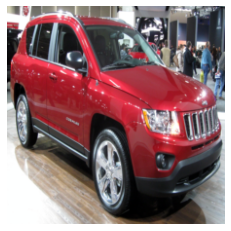




Prediction: Buick Rainier SUV 2007
Ground Truth: Ford Focus Sedan 2007


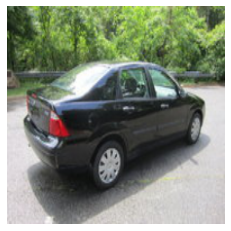




Prediction: BMW M6 Convertible 2010
Ground Truth: Aston Martin V8 Vantage Convertible 2012


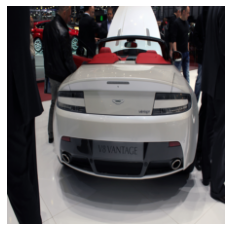




Prediction: BMW X6 SUV 2012
Ground Truth: BMW X6 SUV 2012


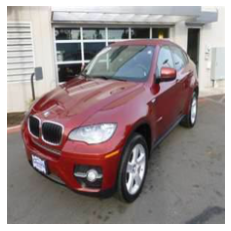




Prediction: Ford Ranger SuperCab 2011
Ground Truth: Ford Ranger SuperCab 2011


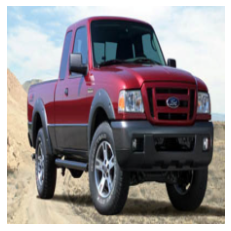




Prediction: Audi S5 Coupe 2012
Ground Truth: Audi S4 Sedan 2012


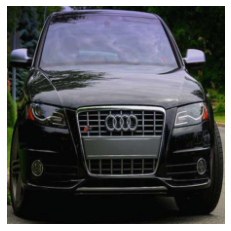




Prediction: Fisker Karma Sedan 2012
Ground Truth: Tesla Model S Sedan 2012


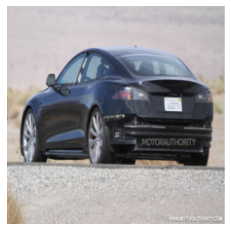




Prediction: Hyundai Veloster Hatchback 2012
Ground Truth: Hyundai Veloster Hatchback 2012


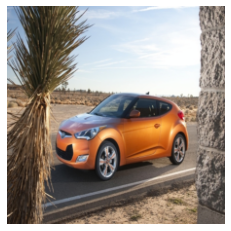




Prediction: Volvo 240 Sedan 1993
Ground Truth: Volvo 240 Sedan 1993


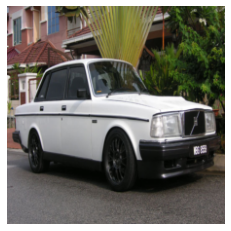




Prediction: Audi 100 Wagon 1994
Ground Truth: Audi 100 Wagon 1994


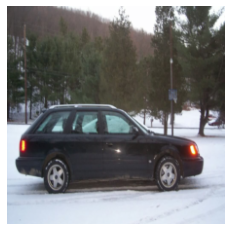




Prediction: Ferrari California Convertible 2012
Ground Truth: Ferrari 458 Italia Coupe 2012


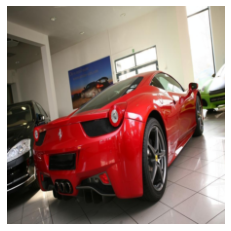




Prediction: Nissan Juke Hatchback 2012
Ground Truth: Nissan Juke Hatchback 2012


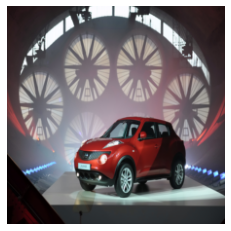




Prediction: Bugatti Veyron 16.4 Convertible 2009
Ground Truth: Bugatti Veyron 16.4 Coupe 2009


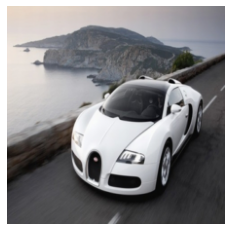




Prediction: Audi S6 Sedan 2011
Ground Truth: Audi S6 Sedan 2011


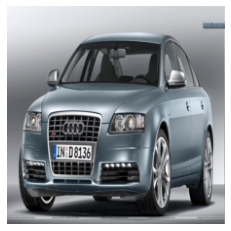




Prediction: Dodge Ram Pickup 3500 Crew Cab 2010
Ground Truth: Dodge Ram Pickup 3500 Crew Cab 2010


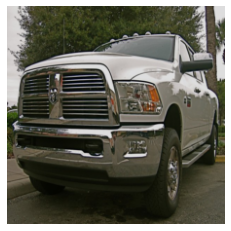




Prediction: Chevrolet Camaro Convertible 2012
Ground Truth: Chevrolet Camaro Convertible 2012


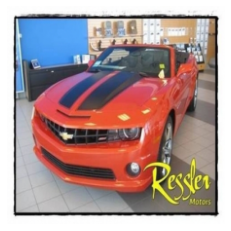

In [8]:
def imshow(img, title=None):
    """Imshow for Tensor."""
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.pause(0.001)

imgs, gts = next(iter(test_dataloader))

with torch.no_grad():
    preds = np.argmax(model(imgs), axis=1)

for img, pred, gt in zip(imgs, preds, gts):
    print("Prediction:", idx_to_class[pred.item()])
    print("Ground Truth:", idx_to_class[gt.item()])
    imshow(img)
    print('\n\n')